# **Pump it Up: Mining the Water Table**

This script focuses on loading, exploring, preprocessing, and preparing data for further analysis or machine learning modeling. Below is a breakdown of the steps involved in this process.

The data comes from: [Pump it Up: Data Mining the Water Table](https://www.drivendata.org/competitions/7/pump-it-up-data-mining-the-water-table/data/)  
The goal of this competition is to predict which water pumps are broken in order to promote access to clean water in Tanzania. It is a practice competition at the intermediate level.


## 📌 **Importing Required Libraries and Loading the Data**


In [1]:
import pandas as pd
import numpy as np

In [2]:
x_df = pd.read_csv('https://raw.githubusercontent.com/Albertorp-ds/portfolio/refs/heads/master/ML/Water_pump/Training_set_values.csv')
y_df = pd.read_csv('https://raw.githubusercontent.com/Albertorp-ds/portfolio/refs/heads/master/ML/Water_pump/Training_set_labels.csv')

df = pd.merge(x_df,y_df,left_on= 'id',right_on='id')

In [3]:
t_df = pd.read_csv('https://raw.githubusercontent.com/Albertorp-ds/portfolio/refs/heads/master/ML/Water_pump/test.csv')

## 📌 **Initial Data Exploration**


In [4]:
t_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14850 entries, 0 to 14849
Data columns (total 40 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     14850 non-null  int64  
 1   amount_tsh             14850 non-null  float64
 2   date_recorded          14850 non-null  object 
 3   funder                 13980 non-null  object 
 4   gps_height             14850 non-null  int64  
 5   installer              13973 non-null  object 
 6   longitude              14850 non-null  float64
 7   latitude               14850 non-null  float64
 8   wpt_name               14850 non-null  object 
 9   num_private            14850 non-null  int64  
 10  basin                  14850 non-null  object 
 11  subvillage             14751 non-null  object 
 12  region                 14850 non-null  object 
 13  region_code            14850 non-null  int64  
 14  district_code          14850 non-null  int64  
 15  lg

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59400 entries, 0 to 59399
Data columns (total 41 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     59400 non-null  int64  
 1   amount_tsh             59400 non-null  float64
 2   date_recorded          59400 non-null  object 
 3   funder                 55763 non-null  object 
 4   gps_height             59400 non-null  int64  
 5   installer              55745 non-null  object 
 6   longitude              59400 non-null  float64
 7   latitude               59400 non-null  float64
 8   wpt_name               59398 non-null  object 
 9   num_private            59400 non-null  int64  
 10  basin                  59400 non-null  object 
 11  subvillage             59029 non-null  object 
 12  region                 59400 non-null  object 
 13  region_code            59400 non-null  int64  
 14  district_code          59400 non-null  int64  
 15  lg

In [7]:
df.describe()

,id,amount_tsh,gps_height,longitude,latitude,num_private,region_code,district_code,population,construction_year
count,59400.000000,59400.000000,59400.000000,59400.000000,5.940000e+04,59400.000000,59400.000000,59400.000000,59400.000000,59400.000000
mean,37115.131768,317.650385,668.297239,34.077427,-5.706033e+00,0.474141,15.297003,5.629747,179.909983,1300.652475
std,21453.128371,2997.574558,693.116350,6.567432,2.946019e+00,12.236230,17.587406,9.633649,471.482176,951.620547
min,0.000000,0.000000,-90.000000,0.000000,-1.164944e+01,0.000000,1.000000,0.000000,0.000000,0.000000
25%,18519.750000,0.000000,0.000000,33.090347,-8.540621e+00,0.000000,5.000000,2.000000,0.000000,0.000000
50%,37061.500000,0.000000,369.000000,34.908743,-5.021597e+00,0.000000,12.000000,3.000000,25.000000,1986.000000
75%,55656.500000,20.000000,1319.250000,37.178387,-3.326156e+00,0.000000,17.000000,5.000000,215.000000,2004.000000
max,74247.000000,350000.000000,2770.000000,40.345193,-2.000000e-08,1776.000000,99.000000,80.000000,30500.000000,2013.000000


In [7]:
from ydata_profiling import ProfileReport
profile = ProfileReport(df, explorative=True)

profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [8]:
categorical_columns = df.select_dtypes(include=['object']).columns
numerical_columns = df.select_dtypes(exclude=['object']).columns


for col in categorical_columns:
    df[col] = df[col].astype('category')


## 📌 **Tratamiento de nulos explicitos**



In [9]:
col_w_null = [col for col in df.columns if df[col].isnull().any()]
col_w_null

['funder',
 'installer',
 'wpt_name',
 'subvillage',
 'public_meeting',
 'scheme_management',
 'scheme_name',
 'permit']

In [10]:
print(df[col_w_null].info())
print(' ')
df[col_w_null].isnull().mean() * 100



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59400 entries, 0 to 59399
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   funder             55763 non-null  category
 1   installer          55745 non-null  category
 2   wpt_name           59398 non-null  category
 3   subvillage         59029 non-null  category
 4   public_meeting     56066 non-null  category
 5   scheme_management  55522 non-null  category
 6   scheme_name        30590 non-null  category
 7   permit             56344 non-null  category
dtypes: category(8)
memory usage: 3.0 MB
None
 


funder                6.122896
installer             6.153199
wpt_name              0.003367
subvillage            0.624579
public_meeting        5.612795
scheme_management     6.528620
scheme_name          48.501684
permit                5.144781
dtype: float64

In [11]:
unique_counts = {col: df[col].nunique() for col in col_w_null}
unique_counts

{'funder': 1896,
 'installer': 2145,
 'wpt_name': 37399,
 'subvillage': 19287,
 'public_meeting': 2,
 'scheme_management': 11,
 'scheme_name': 2695,
 'permit': 2}

### Summary

| Column             | Non-Nulls | % Nulls   | Unique Values |
|--------------------|-----------|-----------|----------------|
| funder             | 55,763    | 6.12%     | 1,896          |
| installer          | 55,745    | 6.15%     | 2,145          |
| wpt_name           | 59,398    | 0.00%     | 37,399         |
| subvillage         | 59,029    | 0.62%     | 19,287         |
| public_meeting     | 56,066    | 5.61%     | 2              |
| scheme_management  | 55,522    | 6.53%     | 11             |
| scheme_name        | 30,590    | 48.50%    | 2,695          |
| permit             | 56,344    | 5.14%     | 2              |

> **Notes:**
> - `scheme_name` has the highest percentage of missing values (≈48.5%). Handling so many nulls requires imputation or removal, which might introduce noise or bias.
> - The columns `wpt_name` and `subvillage` have a very high number of unique values, indicating highly specific or granular information. Their high cardinality should be treated carefully, as it may hinder model learning and reduce generalization. These may not be good candidates for modeling.
> - `public_meeting` and `permit` are binary columns (only 2 unique values).


In [ ]:
t_df.drop('scheme_name', axis=1, inplace=True)
df.drop('scheme_name', axis=1, inplace=True)

In [ ]:
df["region_code"] = df["region_code"].astype("category")
df["district_code"] = df["district_code"].astype("category")
t_df["region_code"] = t_df["region_code"].astype("category")
t_df["district_code"] = t_df["district_code"].astype("category")


In [14]:
df_id = df.id
t_df_id = t_df.id

df.drop('id', inplace= True, axis=1)
t_df.drop('id', inplace= True, axis= 1)

### **Visualization of Numerical Variables and Undeclared Missing Values**


In [14]:
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt

     
def histogram_boxplot(data, xlabel = None, title = None, font_scale=2, figsize=(5,4), bins = None):
    """ Boxplot and histogram combined
    data: 1-d data array
    xlabel: xlabel 
    title: title
    font_scale: the scale of the font (default 2)
    figsize: size of fig (default (9,8))
    bins: number of bins (default None / auto)

    example use: histogram_boxplot(np.random.rand(100), bins = 20, title="Fancy plot")
    """
    sns.set(font_scale=font_scale)
    f2, (ax_box2, ax_hist2) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)}, figsize=figsize)
    sns.boxplot(x=data, ax=ax_box2)
    sns.histplot(x=data, ax=ax_hist2, bins=bins) if bins else sns.histplot(x=data, ax=ax_hist2)
    ax_hist2.axvline(np.mean(data),color='g',linestyle='-')
    ax_hist2.axvline(np.median(data),color='y',linestyle='--')
    if xlabel: ax_hist2.set(xlabel=xlabel)
    if title: ax_box2.set(title=title, xlabel="")
    plt.show()



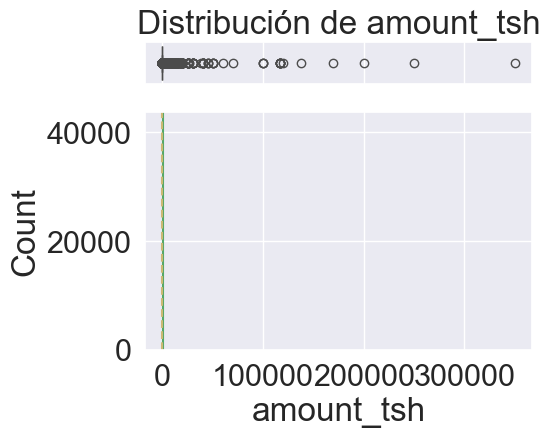

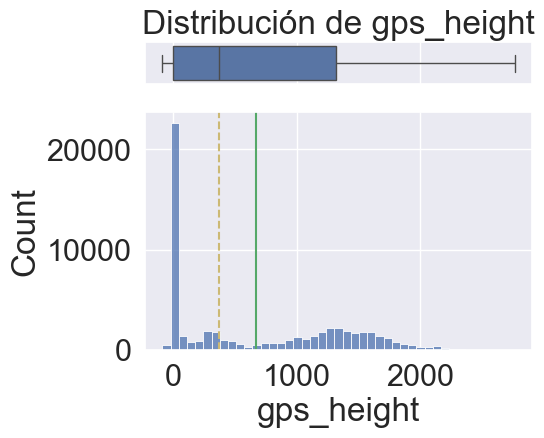

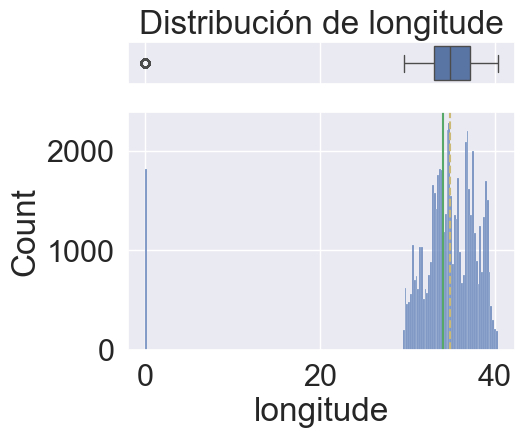

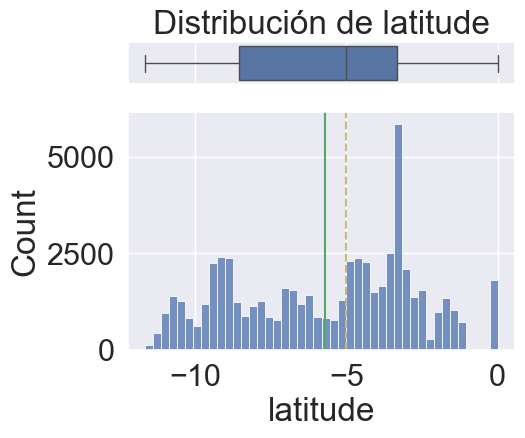

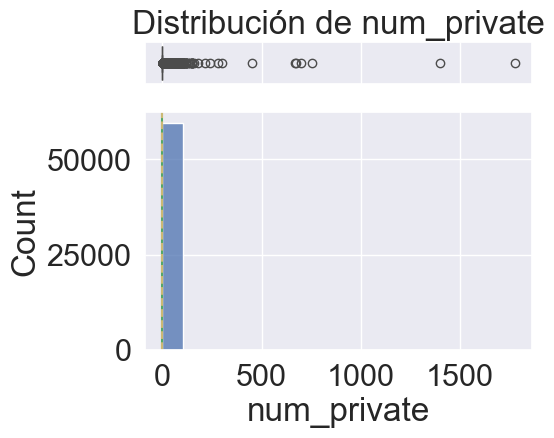

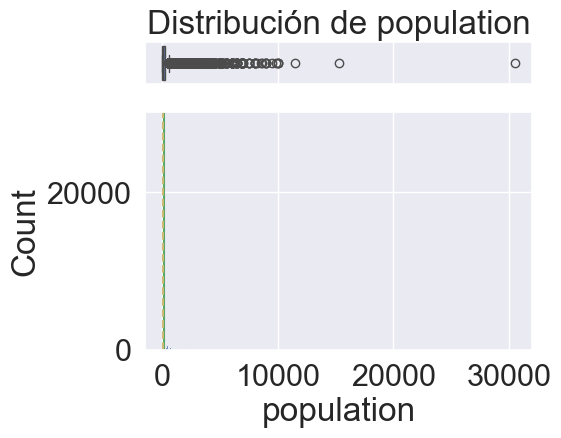

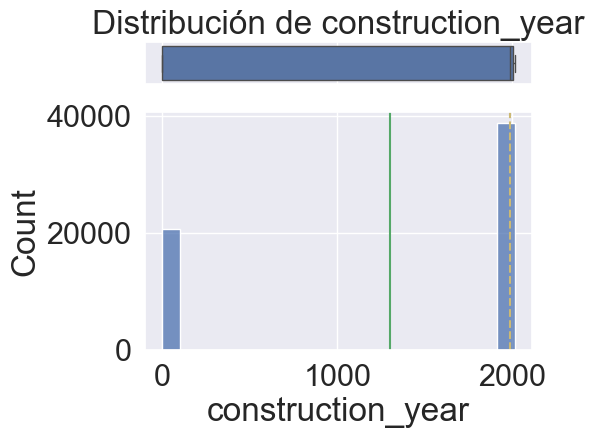

In [16]:
%matplotlib inline

valid_numerical_columns = [col for col in df.select_dtypes(include=['number']).columns if col in df.columns]

for col in valid_numerical_columns:
    histogram_boxplot(df[col], xlabel=col, title=f"Distribución de {col}")


In [15]:
df.amount_tsh.value_counts(normalize=True)

amount_tsh
0.0         0.700993
500.0       0.052222
50.0        0.041616
1000.0      0.025051
20.0        0.024630
              ...   
6300.0      0.000017
120000.0    0.000017
138000.0    0.000017
350000.0    0.000017
59.0        0.000017
Name: proportion, Length: 98, dtype: float64

In [16]:
df.num_private.value_counts(normalize= True)


num_private
0       0.987256
6       0.001364
1       0.001229
5       0.000774
8       0.000774
          ...   
42      0.000017
23      0.000017
136     0.000017
698     0.000017
1402    0.000017
Name: proportion, Length: 65, dtype: float64

In [17]:
df.drop('num_private', axis = 1, inplace= True)
t_df.drop('num_private', axis = 1, inplace= True)

In [18]:
df.population.value_counts(normalize= True)

population
0       0.359949
1       0.118266
200     0.032660
150     0.031852
250     0.028300
          ...   
6330    0.000017
5030    0.000017
656     0.000017
948     0.000017
788     0.000017
Name: proportion, Length: 1049, dtype: float64

In [19]:
df_cont = df.select_dtypes(include=np.number).copy()
t_df_cont= t_df.select_dtypes(include=np.number).copy()


In [20]:
df_cont.construction_year.value_counts(normalize=True)


construction_year
0       0.348636
2010    0.044529
2008    0.043990
2009    0.042643
2000    0.035202
2007    0.026717
2006    0.024764
2003    0.021650
2011    0.021145
2004    0.018906
2012    0.018249
2002    0.018098
1978    0.017458
1995    0.017071
2005    0.017020
1999    0.016481
1998    0.016263
1990    0.016061
1985    0.015909
1980    0.013653
1996    0.013653
1984    0.013114
1982    0.012525
1994    0.012424
1972    0.011919
1974    0.011380
1997    0.010842
1992    0.010774
1993    0.010236
2001    0.009091
1988    0.008771
1983    0.008215
1975    0.007357
1986    0.007306
1976    0.006970
1970    0.006919
1991    0.005455
1989    0.005320
1987    0.005084
1981    0.004007
1977    0.003401
1979    0.003232
1973    0.003098
2013    0.002963
1971    0.002441
1960    0.001717
1967    0.001481
1963    0.001431
1968    0.001296
1969    0.000993
1964    0.000673
1962    0.000505
1961    0.000354
1965    0.000320
1966    0.000286
Name: proportion, dtype: float64

In [21]:
t_df_cont.construction_year = t_df_cont['construction_year'].replace(0, np.nan)
df_cont.construction_year = t_df_cont['construction_year'].replace(0, np.nan)

In [22]:
df_cont.longitude.value_counts(normalize=True)

longitude
0.000000     0.030505
37.375717    0.000034
38.340501    0.000034
39.086183    0.000034
33.005032    0.000034
               ...   
35.885754    0.000017
36.626541    0.000017
37.333530    0.000017
38.970078    0.000017
38.104048    0.000017
Name: proportion, Length: 57516, dtype: float64

In [23]:
t_df_cont.longitude = t_df_cont['longitude'].replace(0, np.nan)
df_cont.longitude = t_df_cont['longitude'].replace(0, np.nan)

In [24]:
t_df_cont.latitude = t_df_cont['latitude'].replace(0, np.nan)
df_cont.latitude = t_df_cont['latitude'].replace(0, np.nan)

In [25]:
df_cont.gps_height.value_counts(normalize=True)

gps_height
 0       0.344074
-15      0.001010
-16      0.000926
-13      0.000926
 1290    0.000875
           ...   
 2378    0.000017
-54      0.000017
 2057    0.000017
 2332    0.000017
 2366    0.000017
Name: proportion, Length: 2428, dtype: float64

In [26]:
df_cont.gps_height = t_df_cont['gps_height'].replace(0, np.nan)
t_df_cont.gps_height = t_df_cont['gps_height'].replace(0, np.nan)

### Analysis of Zero Values and Outliers

It is observed that many variables in the dataset contain a large number of zero values, as well as a considerable number of outliers.

#### Zeros That Likely Represent Missing Values
For certain variables, a value of zero **does not appear to have a valid meaning** and likely indicates undeclared missing data. This is based on the nature of the variables and the geographic context (Tanzania):

- `gps_height`: an elevation of 0 meters above sea level is unlikely in most parts of Tanzania.
- `longitude` and `latitude`: exact zeros do not correspond to actual geographic locations within the country.
- `construction_year`: a construction year of 0 clearly indicates that the information is unavailable.

These variables will be treated as having missing values, since zeros in these cases lack practical or geographic sense.

#### Zeros That May Be Valid
On the other hand, there are variables where zero **could represent a real and meaningful value**:

- `amount_tsh` (amount of water): a well could run dry, justifying a value of 0.
- `population`: it is possible that no population is recorded near a given well.

However, both columns show a **high number of outliers**, suggesting that they should be handled carefully during preprocessing to avoid distorting model results.

> In summary, we will distinguish between zeros that represent missing values and those that may be valid. Specific treatment strategies will be applied to outliers in later stages of the analysis.


---

## 📌 **Handling Outliers in Categorical Variables**


In [27]:
from scipy import stats

def winsorize_with_pandas(s, limits):
    """
    s : pd.Series
        Series to winsorize
    limits : tuple of float
        Tuple of the percentages to cut on each side of the array, 
        with respect to the number of unmasked data, as floats between 0. and 1
    """
    return s.clip(lower=s.quantile(limits[0], interpolation='lower'), 
                  upper=s.quantile(1-limits[1], interpolation='higher'))

## Función para gestionar outliers
def gestiona_outliers(col,clas = 'check'):
    
     print(col.name)
     # Condición de asimetría y aplicación de criterio 1 según el caso
     if abs(col.skew()) < 1:
        criterio1 = abs((col-col.mean())/col.std())>3
     else:
        criterio1 = abs((col-col.median())/stats.median_abs_deviation(col))>8 ## Cambio de MAD a stats.median_abs_deviation(col)
     
     # Calcular primer cuartil     
     q1 = col.quantile(0.25)  
     # Calcular tercer cuartil  
     q3 = col.quantile(0.75)
     # Calculo de IQR
     IQR=q3-q1
     # Calcular criterio 2 (general para cualquier asimetría)
     criterio2 = (col<(q1 - 3*IQR))|(col>(q3 + 3*IQR))
     lower = col[criterio1&criterio2&(col<q1)].count()/col.dropna().count()
     upper = col[criterio1&criterio2&(col>q3)].count()/col.dropna().count()
     # Salida según el tipo deseado
     if clas == 'check':
            return(lower*100,upper*100,(lower+upper)*100)
     elif clas == 'winsor':
            return(winsorize_with_pandas(col,(lower,upper)))
     elif clas == 'miss':
            print('\n MissingAntes: ' + str(col.isna().sum()))
            col.loc[criterio1&criterio2] = np.nan
            print('MissingDespues: ' + str(col.isna().sum()) +'\n')
            return(col)

In [28]:
df_cont.select_dtypes(include=np.number).apply(lambda x: x.skew())

amount_tsh           57.807800
gps_height           -0.179493
longitude            -0.133065
latitude             -0.156238
population           12.660714
construction_year    -0.757823
dtype: float64

In [29]:
df_cont2 = df_cont.copy()
df_cont2[df_cont2.select_dtypes(include=np.number).columns] = \
    df_cont2.select_dtypes(include=np.number).apply(lambda x: gestiona_outliers(x, clas='winsor'))


amount_tsh
gps_height
longitude
latitude
population
construction_year


In [30]:
df_cont2.select_dtypes(include=np.number).apply(lambda x: x.skew())



amount_tsh           1.381347
gps_height          -0.179493
longitude           -0.133065
latitude            -0.156238
population           1.827281
construction_year   -0.757823
dtype: float64

In [31]:
df_cont2.population.describe()

count    59400.000000
mean       144.451953
std        219.509982
min          0.000000
25%          0.000000
50%         25.000000
75%        215.000000
max        862.000000
Name: population, dtype: float64

### Change in Variable Skewness

By comparing skewness values before and after applying a transformation, we observe a clear improvement in certain variables, particularly `amount_tsh` and `population`:

- `amount_tsh` decreased from a skewness of **57.81** to **1.38**. This huge reduction suggests it was initially heavily right-skewed (extreme positive skewness) and was transformed—likely via logarithm, square root, or another normalization method—to approach a more symmetric distribution.

- `population` also showed a significant reduction from **12.66** to **1.83**, indicating it was highly skewed and the applied transformation effectively reduced this distortion.

The other variables (`gps_height`, `longitude`, `latitude`, `construction_year`) retained roughly the same skewness values, suggesting they either did not require transformation or were not altered in this step.

High skewness can negatively affect model performance and interpretability.


### **Visualizacion variables Categoricas**

In [31]:
import plotly.express as px
def cat_plot(col_name, df):
    if col_name == 'date_recorded':  
        return
    
    col = df[col_name]
    if col.dtypes == 'category':
        data = col.value_counts().reset_index()  
        data.columns = ['Category', 'Count'] 
        fig = px.bar(data, x='Category', y='Count', title=f"Distribución de {col_name}")
        fig.show()

In [32]:
categorical_columns = categorical_columns.drop('scheme_name')

In [785]:
for col in categorical_columns:
    cat_plot(col, df)

En las variables categóricas no se observan *missings* no declarados (como valores nulos codificados como "0", "None" o cadenas vacías), lo cual es positivo para el análisis.

Sin embargo, se identifican dos aspectos importantes a considerar:

- **Valores redundantes o similares entre columnas**: Algunas variables pueden estar representando información similar, lo que podría generar redundancia y afectar la calidad del modelo si no se gestiona adecuadamente.

- **Alta cardinalidad en ciertas variables**: Algunas columnas presentan una gran cantidad de categorías distintas, lo que puede dificultar su uso en modelos que no manejan bien este tipo de variables (como los modelos lineales con codificación one-hot).

---

 En etapas posteriores del análisis, se aplicará una función basada en la **V de Cramér** para evaluar la relación de cada variable categórica con la variable objetivo. Esto nos permitirá determinar su relevancia y decidir si deben ser incluidas o descartadas del modelo.

>  Este enfoque nos ayudará a mantener solo aquellas variables categóricas que aporten información útil al proceso de predicción.


## 📌 **Class Distribution in the Target Variable**


In [33]:
varObj =df.status_group
varObj.value_counts(normalize=True)

status_group
functional                 0.543081
non functional             0.384242
functional needs repair    0.072677
Name: proportion, dtype: float64

### Distribution of the Target Variable: `status_group`

The target variable `status_group`, which indicates the functional status of the wells, shows a **considerable class imbalance**. Below is the proportion of each category:

| Status                     | Proportion (%) |
|----------------------------|----------------|
| `functional`               | 54.31%         |
| `non functional`           | 38.42%         |
| `functional needs repair`  | 7.27%          |

---

### Observations

- The **`functional`** class is the majority, representing more than half of the observations.
- The **`functional needs repair`** class is notably underrepresented, with only 7.27% of the total, which may cause models to struggle predicting this minority class.

---

### Strategy to Address the Imbalance

To improve the model’s ability to learn patterns from all classes equally, the **SMOTE (Synthetic Minority Over-sampling Technique)** will be applied later in the modeling process.

🔁 **SMOTE** works by generating synthetic examples of the minority classes to balance the class distribution in the training set.  
✅ This allows the model to train on a more balanced representation and reduces bias towards the majority class.

> ⚠️ It is important to apply SMOTE **after splitting the data into training and test sets**, to prevent synthetic data from contaminating model evaluation.


## 📌 **Variable Imputation**


In [34]:
import feature_engine.imputation as fe_imp
import sklearn.impute as skl_imp

imputer_mean = fe_imp.MeanMedianImputer(imputation_method='mean')
imputer_moda = skl_imp.SimpleImputer(strategy='most_frequent', missing_values=np.nan)


---
### **Numerical Imputation**



In [35]:
imputer_mean.fit(df_cont2)

MeanMedianImputer(imputation_method='mean')

In [36]:

df_imp_mean= imputer_mean.transform(df_cont2)
t_df_imp_mean= imputer_mean.transform(t_df_cont)

In [37]:
df_imp_mean = pd.DataFrame(df_imp_mean,columns= df_cont2.columns)
t_df_imp_mean = pd.DataFrame(t_df_imp_mean,columns=t_df_cont.columns)

In [38]:
df_imp_mean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59400 entries, 0 to 59399
Data columns (total 6 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   amount_tsh         59400 non-null  float64
 1   gps_height         59400 non-null  float64
 2   longitude          59400 non-null  float64
 3   latitude           59400 non-null  float64
 4   population         59400 non-null  int64  
 5   construction_year  59400 non-null  float64
dtypes: float64(5), int64(1)
memory usage: 2.7 MB


---
### **Categorical Imputation**


In [39]:
df_cat = df.select_dtypes(exclude=np.number).copy()
df_cat = df_cat.astype("object")

In [40]:
varObj= df_cat["status_group"]

df_cat.drop("status_group",axis=1 ,inplace= True)

In [41]:
imputer_moda.fit(df_cat)

SimpleImputer(strategy='most_frequent')

In [42]:
df_imp_mode = imputer_moda.transform(df_cat)

In [43]:
t_df_cat = t_df.select_dtypes(exclude=np.number).copy()
t_df_cat = t_df_cat.astype("object")
t_df_imp_mode = imputer_moda.transform(t_df_cat)    

In [44]:
df_imp_mode= pd.DataFrame(df_imp_mode,columns=df_cat.columns)
df_imp_mode.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59400 entries, 0 to 59399
Data columns (total 31 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   date_recorded          59400 non-null  object
 1   funder                 59400 non-null  object
 2   installer              59400 non-null  object
 3   wpt_name               59400 non-null  object
 4   basin                  59400 non-null  object
 5   subvillage             59400 non-null  object
 6   region                 59400 non-null  object
 7   region_code            59400 non-null  object
 8   district_code          59400 non-null  object
 9   lga                    59400 non-null  object
 10  ward                   59400 non-null  object
 11  public_meeting         59400 non-null  object
 12  recorded_by            59400 non-null  object
 13  scheme_management      59400 non-null  object
 14  permit                 59400 non-null  object
 15  extraction_type    

In [45]:
t_df_imp_mode = pd.DataFrame(t_df_imp_mode, columns= t_df_cat.columns)

## 📌 **Variable Encoding with Label Encoder**


In [ ]:
t_df_cat.columns.equals(df_cat.columns)

True

In [ ]:
categorical_cols = df_cat.columns
categorical_cols


Index(['date_recorded', 'funder', 'installer', 'wpt_name', 'basin',
       'subvillage', 'region', 'region_code', 'district_code', 'lga', 'ward',
       'public_meeting', 'recorded_by', 'scheme_management', 'permit',
       'extraction_type', 'extraction_type_group', 'extraction_type_class',
       'management', 'management_group', 'payment', 'payment_type',
       'water_quality', 'quality_group', 'quantity', 'quantity_group',
       'source', 'source_type', 'source_class', 'waterpoint_type',
       'waterpoint_type_group'],
      dtype='object')

In [48]:
# Unimos las variables categóricas y numéricas para luego proceder con la imputación
df_clean = pd.merge(df_imp_mode, df_imp_mean, left_index=True, right_index=True)
t_df_clean = pd.merge(t_df_imp_mode,t_df_imp_mean,left_index=True, right_index=True)


In [49]:
from sklearn.preprocessing import LabelEncoder

df_clean[categorical_cols] = df_clean[categorical_cols].astype(str)
t_df_clean[categorical_cols] = t_df_clean[categorical_cols].astype(str)

encoders = {}

for col in categorical_cols:
    encoder = LabelEncoder()
    encoder.fit(df_clean[col])
    
    df_clean[col] = encoder.transform(df_clean[col])
    
    unseen = set(t_df_clean[col].unique()) - set(encoder.classes_)
    if unseen:
        print(f"⚠️ Warning: Column '{col}' contains unseen values: {unseen}")
    
    
    encoders[col] = encoder


⚠️ Warning: Column 'date_recorded' contains unseen values: {'2011-09-02', '2011-09-22', '2004-02-23', '2004-02-01', '2011-09-10', '2004-01-04', '2011-08-29', '2011-09-24', '2001-03-26', '2011-09-07', '2004-01-12', '2004-12-03', '2004-01-09'}
⚠️ Warning: Column 'funder' contains unseen values: {'Wazieni Bilangali', 'Nicodemu Mkumbw', 'Zara Camp', 'Care/crc', 'Mzee Maisha', 'Mosque Pera', 'Marsfip', 'Uwamalu', 'Colonies', 'Mzee Ole', 'Daids', 'Tasmin', 'Water Of Water', 'Tasaf/village Community', 'Othodox Church', 'Bi Chau', 'Ji-eun', 'Krf', 'Wingeti Safari', 'Lakailo', 'Umfaiswary', 'Pangaboi Health Centre', 'Nytamboka', 'School Administration', 'Ded And Priva', 'Dimel', 'St Savery Primary School', 'Colony', 'Ndovu Resources', 'Kulwa', 'Nakayama', 'Particular', 'Bi Ndizi', 'Lench Talamaye', 'Waingereza', 'Old Bank', 'Omary Dodo', 'Mzee Matiti Edwin', 'Sant Sigfrigs Sweden', 'Magufudi', 'Mwika Lekura Water User', 'Mkukuta', 'Agness', 'Unise', 'Aveda', 'Sikonge Copper Mi', 'Local Governme

### Categorical Variable Encoding with LabelEncoder

In this cell, the categorical variables of `df_clean` and `t_df_clean` are encoded using `LabelEncoder`. The process includes:

1. **Conversion to string:** Ensures all columns are of string type.  
2. **Encoder training:** `LabelEncoder` is fitted only on the `df_clean` (training) data.  
3. **Transformation:** Categories are replaced by numeric values.  
4. **Unseen value detection:** Identifies if `t_df_clean` contains new categories not seen during training.  
5. **Storage:** Each encoder is saved in a dictionary for later use.


In [50]:
for col in categorical_cols:
    encoder = encoders[col]
    
    t_df_clean[col] = t_df_clean[col].apply(lambda x: x if x in encoder.classes_ else None)

    # For safety, fill unknowns with a known label (e.g., most frequent or 'missing')
    # Here we fill with the first class if unknown:
    t_df_clean[col] = t_df_clean[col].fillna(encoder.classes_[0])

    # Transform
    t_df_clean[col] = encoder.transform(t_df_clean[col])


### Explanation of Categorical Variable Preprocessing

In this code block, a safe transformation of categorical variables is performed using previously fitted encoders. Below is a step-by-step explanation of what it does:

1. **Category validation:**  
   Checks if each value in the column exists in the known classes of the encoder (`encoder.classes_`).  
   If it does not exist (i.e., it is an unknown or new category), it is replaced with `None`.

2. **Handling unknown or null categories:**  
   To avoid errors during transformation, unknown or missing categories (`None`) are filled with a known value.  
   In this case, the **first known category of the encoder** (`encoder.classes_[0]`) is used, although the most frequent category or a label like `"missing"` could also be used depending on the chosen strategy.

3. **Transformation with the encoder:**  
   Finally, the column is transformed using `encoder.transform()`, converting categories into their respective numeric representations.

---

**Main Objective:**  
> This approach ensures that **no errors occur** when applying the encoder to new data (e.g., validation or test sets), even if they contain categories not seen during training.


In [51]:
df_test = t_df_clean

### Backward Sequential Feature Selection with Extra Trees Classifier

In this analysis, we apply the technique of **Backward Sequential Feature Selection** to identify the most relevant variables that optimize model performance. We used the **Extra Trees Classifier**, an ensemble method that introduces randomness in the tree-building process, which can improve the model’s generalization ability.

#### 🔍 Process Details:

1. **Extra Trees Classifier Model**  
   The `ExtraTreesClassifier` was used with the following parameters:  
   - `n_estimators=50`: Builds 50 decision trees.  
   - `n_jobs=-1`: Uses all available CPU cores to parallelize training.

2. **Feature Selection**  
   The `SequentialFeatureSelector` from the `mlxtend` package was used with these settings:  
   - `forward=False`: Performs **backward selection**, starting with all features and removing those that do not significantly contribute.  
   - `floating=False`: Removed features cannot be re-added.  
   - `k_features='best'`: The selector automatically finds the optimal number of features.  
   - `scoring='accuracy'`: Uses **accuracy** as the evaluation metric.  
   - `cv=4`: 4-fold cross-validation for robust evaluation.

3. **Selection Process Visualization**  
   A plot is generated showing the model’s accuracy (with standard deviation) as a function of the number of selected features. This helps visually identify how many variables are needed to achieve the best possible performance.

> The plot provides a clear view of the trade-off point between model complexity and accuracy, which in this case is 12 features.


In [71]:
from sklearn.ensemble import ExtraTreesClassifier
from mlxtend.feature_selection import SequentialFeatureSelector as sfs

clf= ExtraTreesClassifier(n_estimators=50,n_jobs=-1)

sfs_forw = sfs(clf, 
          k_features='best', 
          forward=False, 
          floating=False, 
          scoring='accuracy',
          cv=4)

sfs_forw = sfs_forw.fit(df_clean, varObj)

print('\nSequential Backward Selection:')
print(sfs_forw.k_feature_names_)



Sequential Backward Selection:
('date_recorded', 'funder', 'installer', 'wpt_name', 'subvillage', 'region', 'region_code', 'lga', 'ward', 'public_meeting', 'recorded_by', 'scheme_management', 'permit', 'extraction_type', 'extraction_type_class', 'management', 'payment_type', 'quality_group', 'quantity', 'quantity_group', 'source', 'source_class', 'waterpoint_type', 'amount_tsh', 'population', 'construction_year')


<Figure size 1200x600 with 0 Axes>

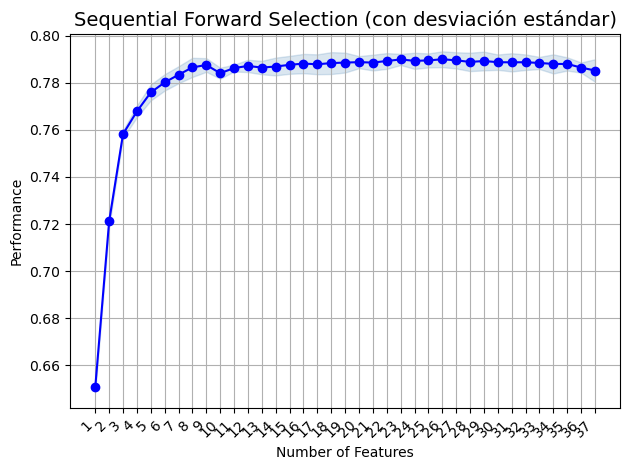

In [72]:
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs
import matplotlib.pyplot as plt

# Crear un tamaño de figura más grande
fig = plt.figure(figsize=(12, 6))  # ancho x alto en pulgadas

# Generar el gráfico
plot_sfs(sfs_forw.get_metric_dict(), kind='std_dev')

# Título y rejilla
plt.title('Sequential Forward Selection (con desviación estándar)', fontsize=14)
plt.grid(True)

# Rotar etiquetas del eje X si están superpuestas
plt.xticks(rotation=45, ha='right', fontsize=10)  # ha = horizontal alignment

# Ajustar el diseño para que no se corten etiquetas
plt.tight_layout()

# Mostrar el gráfico
plt.show()


In [ ]:
metric_dict = sfs_forw.get_metric_dict()

features_10 = metric_dict[10]['feature_names']

etc_sfs = list(features_10)

print(etc_sfs)


['date_recorded', 'funder', 'lga', 'ward', 'extraction_type_class', 'payment_type', 'quantity', 'source', 'waterpoint_type', 'population']


In [52]:
etc_sfs2 = ['date_recorded', 'funder',
            'lga', 'ward', 
            'extraction_type_class', 'payment_type',
            'quantity', 'source',
            'waterpoint_type', 'population']



---

## 📌 **Class Balancing**


In [55]:
from imblearn.over_sampling import SMOTE
from collections import Counter
from sklearn.model_selection import train_test_split


X = df_clean
y= varObj

X_tr, X_tst, y_tr, y_tst = train_test_split(
    X[etc_sfs2], y,             
    test_size=0.2,    
    random_state=42,  
    stratify=y        
)

smote = SMOTE(random_state=42, sampling_strategy='minority')

X_res, y_res = smote.fit_resample(X_tr, y_tr)

In [56]:
print("Antes del balanceo:", Counter(y))
print("Después del balanceo:", Counter(y_res))

Antes del balanceo: Counter({'functional': 32259, 'non functional': 22824, 'functional needs repair': 4317})
Después del balanceo: Counter({'functional': 25807, 'functional needs repair': 25807, 'non functional': 18259})


In [57]:
print(X_res.shape)
print(y_res.shape)


(69873, 10)
(69873,)


### Class Balancing with SMOTE

**SMOTE** is used to balance the classes of the target variable by generating synthetic samples for the minority class.

#### Steps:

1. Define **X** (features) and **y** (target variable).  
2. Apply SMOTE using `fit_resample` to balance the classes.

#### Results:

- **Before balancing:**  
  - `functional`: 32,259  
  - `non functional`: 22,824  
  - `functional needs repair`: 4,317

- **After balancing:**  
  All three classes have 32,259 samples.

This improves the model's ability to predict minority classes.


---

## 📌 **Model with Variable Selection via SFS**


In [62]:
from sklearn.ensemble import RandomForestClassifier

rf1 = RandomForestClassifier(random_state=42, n_jobs=-1)
rf1.fit(X_res, y_res)

RandomForestClassifier(n_jobs=-1, random_state=42)

In [63]:
y_pred_rf1 = rf1.predict(X_tst)

In [64]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

print(classification_report(y_tst, y_pred_rf1))

print(confusion_matrix(y_tst, y_pred_rf1))


                         precision    recall  f1-score   support

             functional       0.81      0.83      0.82      6452
functional needs repair       0.37      0.45      0.40       863
         non functional       0.82      0.76      0.79      4565

               accuracy                           0.77     11880
              macro avg       0.67      0.68      0.67     11880
           weighted avg       0.78      0.77      0.78     11880

[[5343  480  629]
 [ 344  390  129]
 [ 897  195 3473]]


---
### Tuning

In [ ]:
# Malla de hiperparámetros
param_dist = {
    'n_estimators': [100, 200, 300, 500, 1000],  # Varios valores
    'max_depth': [10, 20, 30, None],
    'min_samples_split': [2, 5, 10, 20],
    'min_samples_leaf': [1, 2, 4, 8],
    'max_features': ['sqrt', 'log2']
}

In [66]:
from sklearn.model_selection import RandomizedSearchCV
random_search3 = RandomizedSearchCV(
    estimator=rf1,
    param_distributions=param_dist, 
    n_iter=50,  # Número de combinaciones aleatorias
    scoring='accuracy',  # Buscamos la mejor exactitud
    cv=5,  # 5 folds de validación cruzada
    n_jobs=-1,  # Usar todos los núcleos
    verbose=2,
    random_state=42
)



In [68]:
random_search3.fit(X_res, y_res)


Fitting 5 folds for each of 50 candidates, totalling 250 fits


RandomizedSearchCV(cv=5,
                   estimator=RandomForestClassifier(n_jobs=-1, random_state=42),
                   n_iter=50, n_jobs=-1,
                   param_distributions={'max_depth': [10, 20, 30, None],
                                        'max_features': ['sqrt', 'log2'],
                                        'min_samples_leaf': [1, 2, 4, 8],
                                        'min_samples_split': [2, 5, 10, 20],
                                        'n_estimators': [100, 200, 300, 500,
                                                         1000]},
                   random_state=42, scoring='accuracy', verbose=2)

In [69]:
from sklearn.metrics import accuracy_score
print(f"Best Parameters: {random_search3.best_params_}")
rf1t= random_search3.best_estimator_
y_pred_rf1t = rf1t.predict(X_tst)
accuracy = accuracy_score(y_tst, y_pred_rf1t)
print(f"Accuracy: {accuracy}")

Best Parameters: {'n_estimators': 1000, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_features': 'log2', 'max_depth': None}
Accuracy: 0.7826599326599326


Best Parameters: {'n_estimators': 1000, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_features': 'log2', 'max_depth': None}
Accuracy: 0.7826599326599326

In [70]:
print(classification_report(y_tst, y_pred_rf1t))
print(confusion_matrix(y_tst, y_pred_rf1t))


                         precision    recall  f1-score   support

             functional       0.81      0.84      0.83      6452
functional needs repair       0.38      0.46      0.42       863
         non functional       0.84      0.76      0.80      4565

               accuracy                           0.78     11880
              macro avg       0.68      0.69      0.68     11880
           weighted avg       0.79      0.78      0.79     11880

[[5440  459  553]
 [ 348  401  114]
 [ 910  198 3457]]


---

In [71]:
from sklearn.ensemble import ExtraTreesClassifier

ect = ExtraTreesClassifier(random_state=42, n_jobs=-1)
ect.fit(X_res, y_res)

ExtraTreesClassifier(n_jobs=-1, random_state=42)

In [72]:
y_pred_ect = ect.predict(X_tst)
print(classification_report(y_tst, y_pred_ect))
print(confusion_matrix(y_tst, y_pred_ect))

                         precision    recall  f1-score   support

             functional       0.81      0.83      0.82      6452
functional needs repair       0.36      0.45      0.40       863
         non functional       0.82      0.76      0.79      4565

               accuracy                           0.77     11880
              macro avg       0.66      0.68      0.67     11880
           weighted avg       0.78      0.77      0.78     11880

[[5346  483  623]
 [ 351  389  123]
 [ 901  211 3453]]


In [74]:
param_dist = {
    'n_estimators': [100, 200, 300, 500, 1000],  
    'max_depth': [10, 20, 30, None],
    'min_samples_split': [2, 5, 10, 20],
    'min_samples_leaf': [1, 2, 4, 8],
    'max_features': ['sqrt', 'log2']
}

random_search_ect = RandomizedSearchCV(
    estimator=ect,
    param_distributions=param_dist, 
    n_iter=50,  
    scoring='accuracy',  
    cv=5,  
    n_jobs=-1,  
    verbose=2,
    random_state=42
)
random_search_ect.fit(X_res, y_res)

Fitting 5 folds for each of 50 candidates, totalling 250 fits


RandomizedSearchCV(cv=5,
                   estimator=ExtraTreesClassifier(n_jobs=-1, random_state=42),
                   n_iter=50, n_jobs=-1,
                   param_distributions={'max_depth': [10, 20, 30, None],
                                        'max_features': ['sqrt', 'log2'],
                                        'min_samples_leaf': [1, 2, 4, 8],
                                        'min_samples_split': [2, 5, 10, 20],
                                        'n_estimators': [100, 200, 300, 500,
                                                         1000]},
                   random_state=42, scoring='accuracy', verbose=2)

In [75]:
print(f"Best Parameters: {random_search_ect.best_params_}")
etct= random_search_ect.best_estimator_
y_pred_etct = etct.predict(X_tst)
accuracy = accuracy_score(y_tst, y_pred_etct)
print(f"Accuracy: {accuracy}")

Best Parameters: {'n_estimators': 1000, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_features': 'log2', 'max_depth': None}
Accuracy: 0.781060606060606


Best Parameters: {'n_estimators': 1000, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_features': 'log2', 'max_depth': None}

In [76]:
print(classification_report(y_tst, y_pred_etct))
print(confusion_matrix(y_tst, y_pred_etct))

                         precision    recall  f1-score   support

             functional       0.82      0.84      0.83      6452
functional needs repair       0.36      0.46      0.41       863
         non functional       0.84      0.76      0.80      4565

               accuracy                           0.78     11880
              macro avg       0.67      0.69      0.68     11880
           weighted avg       0.79      0.78      0.78     11880

[[5410  483  559]
 [ 345  396  122]
 [ 879  213 3473]]


---

In [96]:
from xgboost import XGBClassifier

xgb1 = XGBClassifier(random_state=42, eval_metric='merror' ,n_jobs=-1)

le = LabelEncoder()
y_res_le= le.fit_transform(y_res)
y_tst_le = le.transform(y_tst)

xgb1.fit(X_res, y_res_le)


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='merror',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=-1, num_parallel_tree=None, objective='multi:softprob', ...)

In [82]:
y_pred_xgb1 = xgb1.predict(X_tst)
print(classification_report(y_tst_le, y_pred_xgb1))
print(confusion_matrix(y_tst_le, y_pred_xgb1))

              precision    recall  f1-score   support

           0       0.80      0.81      0.80      6452
           1       0.31      0.56      0.40       863
           2       0.86      0.71      0.77      4565

    accuracy                           0.75     11880
   macro avg       0.65      0.69      0.66     11880
weighted avg       0.79      0.75      0.76     11880

[[5216  785  451]
 [ 289  485   89]
 [1018  318 3229]]


In [83]:
param_dist = {
    'n_estimators': [100, 200, 300, 400, 500],
    'max_depth': [3, 4, 5, 6, 7, 8, 10],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'subsample': [0.6, 0.7, 0.8, 0.9, 1.0],
    'colsample_bytree': [0.6, 0.7, 0.8, 0.9, 1.0],
    'gamma': [0, 0.1, 0.2, 0.3],
    'reg_alpha': [0, 0.01, 0.1, 1],
    'reg_lambda': [1, 1.5, 2, 3]
}

random_search_xgb = RandomizedSearchCV(
    estimator=xgb1,
    param_distributions=param_dist,
    n_iter=50,  
    scoring='f1_macro',  
    cv=5,
    verbose=1,
    random_state=42,
    n_jobs=-1
)
random_search_xgb.fit(X_res, y_res_le)
print(f"Best Parameters: {random_search_xgb.best_params_}")

Fitting 5 folds for each of 50 candidates, totalling 250 fits
Best Parameters: {'subsample': 0.8, 'reg_lambda': 1, 'reg_alpha': 1, 'n_estimators': 300, 'max_depth': 10, 'learning_rate': 0.2, 'gamma': 0, 'colsample_bytree': 1.0}


In [84]:
xbg1t= random_search_xgb.best_estimator_
y_pred_xbg1t = xbg1t.predict(X_tst) 
accuracy = accuracy_score(y_tst_le, y_pred_xbg1t)
print(f"Accuracy: {accuracy}")

Accuracy: 0.7786195286195287


In [87]:
print(classification_report(y_tst_le, y_pred_xbg1t))
print(confusion_matrix(y_tst_le, y_pred_xbg1t))

              precision    recall  f1-score   support

           0       0.81      0.83      0.82      6452
           1       0.37      0.48      0.42       863
           2       0.83      0.76      0.79      4565

    accuracy                           0.78     11880
   macro avg       0.67      0.69      0.68     11880
weighted avg       0.79      0.78      0.78     11880

[[5363  492  597]
 [ 342  411  110]
 [ 889  200 3476]]


---

## Classification Models Summary Comparison

Below is a comparison of the three trained models for classifying the functional status of water pumps: `RandomForest (rf1t)`, `ExtraTrees (etct)`, and `XGBoost (xgbt)`. The comparison is based on metrics such as accuracy, recall, F1-score, and overall accuracy.

| Metric / Class              | rf1t        | etct        | xgbt        |
|----------------------------|-------------|-------------|-------------|
| **Accuracy**               | 0.78        | 0.78        | 0.78        |
| **F1-score Macro Avg**     | 0.68        | 0.68        | 0.68        |
| **F1-score Weighted Avg**  | 0.79        | 0.78        | 0.78        |

### Performance by Class

| Class                      | Model | Precision | Recall | F1-score | Support |
|----------------------------|-------|-----------|--------|----------|---------|
| **Functional (0)**         | rf1t  | 0.81      | 0.84   | 0.83     | 6452    |
|                            | etct  | 0.82      | 0.84   | 0.83     | 6452    |
|                            | xgbt  | 0.81      | 0.83   | 0.82     | 6452    |
| **Needs Repair (1)**       | rf1t  | 0.38      | 0.46   | 0.42     | 863     |
|                            | etct  | 0.36      | 0.46   | 0.41     | 863     |
|                            | xgbt  | 0.37      | 0.48   | 0.42     | 863     |
| **Non Functional (2)**     | rf1t  | 0.84      | 0.76   | 0.80     | 4565    |
|                            | etct  | 0.84      | 0.76   | 0.80     | 4565    |
|                            | xgbt  | 0.83      | 0.76   | 0.79     | 4565    |


### Conclusions

- All models have a similar **accuracy** of 78%.  
- The **best performance on the minority class** (`functional needs repair`) is by `xgbt`, with the highest recall (0.48) and an F1-score tied with `rf1t` (0.42).  
- `rf1t` and `etct` show almost identical performance, with `rf1t` slightly better in overall precision.  
- The hardest class to predict correctly remains class 1 (needs repair), likely due to its low support.


---

## Modelado final (XGB)

In [88]:
smote = SMOTE(random_state=42, sampling_strategy='minority')
X_f, y_f = smote.fit_resample(X[etc_sfs2], y)

In [90]:
le = LabelEncoder()
y_f_le= le.fit_transform(y_f)

In [91]:
xbg1t.fit(X_f, y_f_le)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=1.0, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='merror',
              feature_types=None, gamma=0, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.2, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=10,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=300,
              n_jobs=-1, num_parallel_tree=None, objective='multi:softprob', ...)

In [99]:
predictions_xgb1t= xbg1t.predict(df_test[etc_sfs2])

decoded_preds = le.inverse_transform(predictions_xgb1t)
pred_xgb1=pd.DataFrame(decoded_preds,columns= ['status_group'])


In [102]:
submission_xgb= pd.merge(t_df_id, pred_xgb1, left_index=True, right_index=True)
submission_xgb.set_index('id', inplace=True)
submission_xgb

,status_group
id,
50785,non functional
51630,functional needs repair
17168,functional
45559,non functional
49871,functional
...,...
39307,non functional
18990,functional
28749,functional


In [103]:
submission_xgb.to_csv('submission_xgb.csv', index=True)

![Resultados del modelo](submission_xgb.png)


----
### Modelado Final Random Forest

In [104]:
rf1t.fit(X_f, y_f)
predictions_rf1t= rf1t.predict(df_test[etc_sfs2])
predictions_rf1t

array(['non functional', 'functional', 'non functional', ...,
       'functional', 'functional', 'non functional'], dtype=object)

In [106]:
predictions_rf1t = pd.DataFrame(predictions_rf1t,columns= ['status_group'])
submission_rf= pd.merge(t_df_id, predictions_rf1t, left_index=True, right_index=True)
submission_rf.set_index('id', inplace=True)
submission_rf

,status_group
id,
50785,non functional
51630,functional
17168,non functional
45559,non functional
49871,functional
...,...
39307,non functional
18990,functional
28749,functional


In [107]:
submission_rf.to_csv('submission_rf.csv', index=True)

![Resultados del modelo](submission_rf.png)